# HPO with DeepHyper

## Imports and GPU Detection <a class="anchor" id="imports-and-gpu-detection"></a>

<div class="alert alert-warning">

<b>Warning</b>
    
By design asyncio does not allow nested event loops. Jupyter is using Tornado which already starts an event loop. Therefore the following patch is required to run this tutorial.
    
</div>

In [51]:
#!pip3 install shap
#import sys
#!{sys.executable} -m pip install shap

import shap

In [52]:
#!pip install nest_asyncio
#!{sys.executable} -m pip install nest_asyncio
import nest_asyncio
nest_asyncio.apply()

In [53]:
import json
import os
import pathlib
import shutil

#!export TF_CPP_MIN_LOG_LEVEL=3
#!export TF_XLA_FLAGS=--tf_xla_enable_xla_devices

#!{sys.executable} -m pip install matplotlib
import matplotlib.pyplot as plt
import numpy as np
#import tensorflow as tf
from tqdm import tqdm

<div class="alert alert-info">
    
<b>Note</b>
    
The `TF_CPP_MIN_LOG_LEVEL` can be used to avoid the logging of Tensorflow *DEBUG*, *INFO* and *WARNING* statements.
    
</div>

<div class="alert alert-info">
    
<b>Note</b>
    
The following can be used to detect if **GPU** devices are available on the current host.
    
</div>

In [54]:
import math
import random
def f(config):
    val = - config["x"]**2
    if random.random() < 0.1:
        val = math.nan
    return val

In [336]:
import pandas as pd

real_data = pd.read_csv('results8-256-mpi-4.csv')

In [337]:
#real_data.describe

In [338]:
#print(real_data)

In [339]:
objective = 'RUNTIME'

In [340]:

real_data['objective'] = -1 * real_data[objective]

In [341]:
#real_df = df.loc[df['objective'] < q_10]
real_df = real_data.drop(columns=['RUNTIME','elapsed_sec'])

In [342]:
real_df

,p0,p1,p2,p3,p4,p5,p6,objective
0,['openmc-queueless'],[1000000],[4000],[20000],[8],[1],['threads'],480174.0
1,['openmc-queueless'],[6875000],[42200],[91000],[2],[2],['threads'],491051.0
2,['openmc'],[3474000],[49300],[47000],[2],[2],['threads'],501403.0
3,['openmc'],[1388000],[90400],[11000],[2],[2],['cores'],490047.0
4,['openmc-queueless'],[1744000],[700],[19000],[4],[2],['sockets'],436871.0
...,...,...,...,...,...,...,...,...
247,['openmc'],[6519000],[86000],[82000],[6],[2],['threads'],558982.0
248,['openmc'],[6474000],[92100],[94000],[6],[2],['cores'],551930.0
249,['openmc'],[6429000],[94200],[73000],[6],[2],['cores'],558456.0
250,['openmc'],[7124000],[93900],[78000],[6],[2],['threads'],557578.0


In [343]:
print('non-unique columns:')
[e for e in real_df.columns if real_df[e].nunique() != 1]

non-unique columns:


[' p0', 'p1', 'p2', 'p3', 'p4', 'p5', 'p6', 'objective']

(array([  2.,   1.,   0.,   0.,   5.,   7.,  10.,   2.,  19., 206.]),
 array([422174. , 436185.4, 450196.8, 464208.2, 478219.6, 492231. ,
        506242.4, 520253.8, 534265.2, 548276.6, 562288. ]),
 <BarContainer object of 10 artists>)

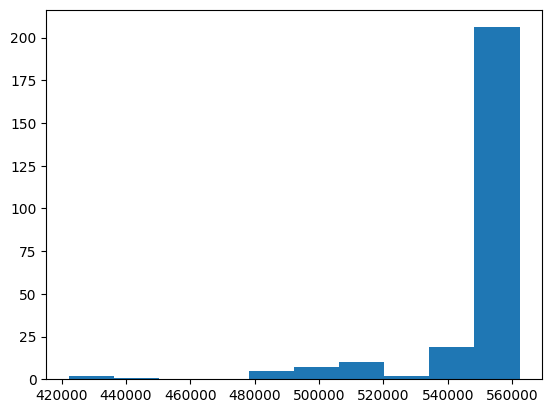

In [344]:
plt.hist(real_df.objective.values)

In [345]:
real_df_cut = real_df#[real_df.objective < 1000.00]

In [346]:
#real_df_cut

In [347]:
# determine categorical and numerical features
numerical_ix = real_df_cut.select_dtypes(include=['int64', 'float64']).columns
categorical_ix = real_df_cut.select_dtypes(include=['object', 'bool']).columns

In [348]:
print(numerical_ix)
print(categorical_ix)

Index(['objective'], dtype='object')
Index([' p0', 'p1', 'p2', 'p3', 'p4', 'p5', 'p6'], dtype='object')


In [349]:
from sklearn.base import BaseEstimator, TransformerMixin

class IdentityTransformer(BaseEstimator, TransformerMixin):
    def __init__(self):
        pass
    
    def fit(self, input_array, y=None):
        return self
    
    def transform(self, input_array, y=None):
        return input_array*1

In [350]:
from sklearn.ensemble import RandomForestRegressor, ExtraTreesRegressor
from sklearn import linear_model
from sklearn.metrics import r2_score
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler,OneHotEncoder, MinMaxScaler, OrdinalEncoder
#!pip install scikit-optimize
import skopt
from sklearn.compose import ColumnTransformer
from sklearn.neighbors import KNeighborsRegressor

In [351]:
t = [('cat', OrdinalEncoder(), categorical_ix), ('num', IdentityTransformer(), numerical_ix)]
data_pipeline = ColumnTransformer(transformers=t)

In [352]:
data_pipeline_model = data_pipeline.fit(real_df_cut)

In [353]:
preprocessed_data = data_pipeline_model.transform(real_df_cut)

In [354]:
preprocessed_data.shape

(252, 8)

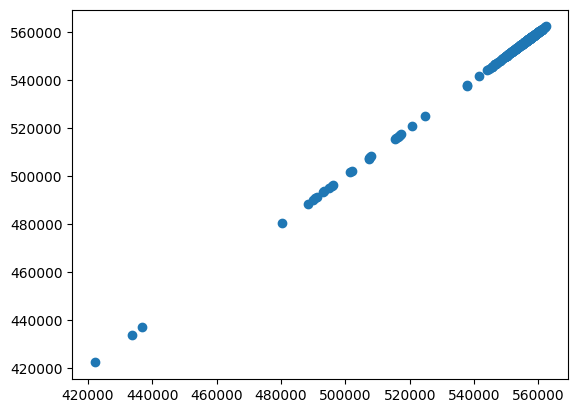

In [355]:
plt.scatter(preprocessed_data[:,7],real_df_cut['objective'].values)

In [356]:
#preprocessed_data[:,7]

In [357]:
regr = RandomForestRegressor()
#regr.fit(preprocessed_data[:,1:],preprocessed_data[:,0])

In [358]:
from sklearn.model_selection import cross_val_score

In [359]:
cv_scores = cross_val_score(regr, preprocessed_data[:,0:7],preprocessed_data[:,7], cv=10)

In [360]:
preprocessed_data.shape

(252, 8)

In [361]:
print(cv_scores)

[-0.77100287  0.74296475  0.77972088 -0.63706245 -0.84410509  0.23200814
 -0.13321766  0.74805831 -1.07630594  0.02159864]


In [362]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(preprocessed_data[:,0:7], preprocessed_data[:,7], test_size=0.50, 
                                                    random_state=42)

In [363]:
X_train.shape

(126, 7)

In [364]:
regr.fit(X_train,y_train)

RandomForestRegressor()

0.8884565623020119


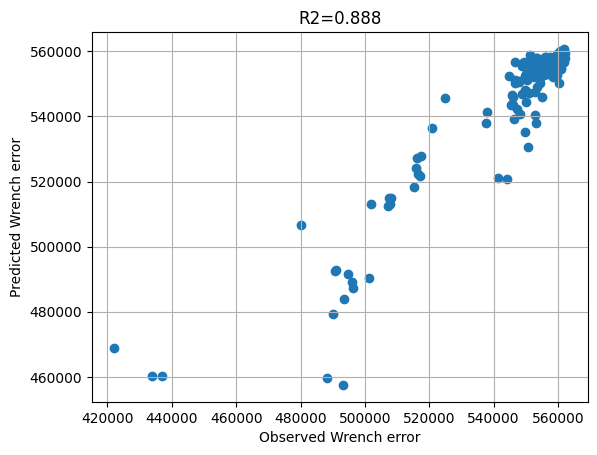

In [365]:
preds = regr.predict(preprocessed_data[:,0:7])
plt.scatter(preprocessed_data[:,7],preds)
r2 = r2_score(preprocessed_data[:,7],preds)
print(r2)
plt.ylabel('Predicted Wrench error')
plt.xlabel('Observed Wrench error')
#plt.suptitle('Wrench simulation error prediction')
plt.title('R2=%1.3f'%r2)
plt.grid()

In [366]:
input_names = real_df_cut.columns.to_list()[:-1]

In [367]:
sorted_idx = regr.feature_importances_.argsort()

In [368]:
print(sorted_idx)
print(input_names)

[6 2 3 0 1 5 4]
[' p0', 'p1', 'p2', 'p3', 'p4', 'p5', 'p6']


In [369]:
input_names_new = []
for inp in input_names:
    k = inp
    input_names_new.append(k)

In [370]:
input_names = input_names_new

In [371]:
import shap

In [372]:
explainer = shap.TreeExplainer(regr)
shap_values = explainer.shap_values(preprocessed_data[:,0:7])

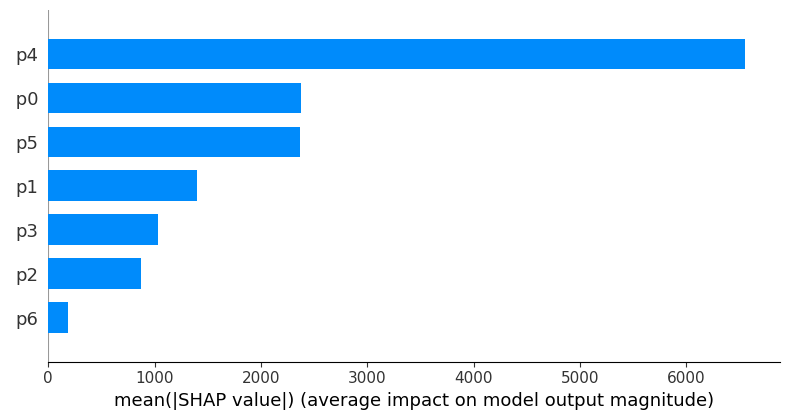

In [373]:
shap.summary_plot(shap_values, feature_names = input_names, plot_type="bar")

In [374]:
X_test1 = pd.DataFrame(preprocessed_data[:,0:7])
X_test1.columns = input_names

In [375]:
#print(X_test1)

In [376]:
import random
random_indices = random.sample(range(X_test1.shape[0]),30)

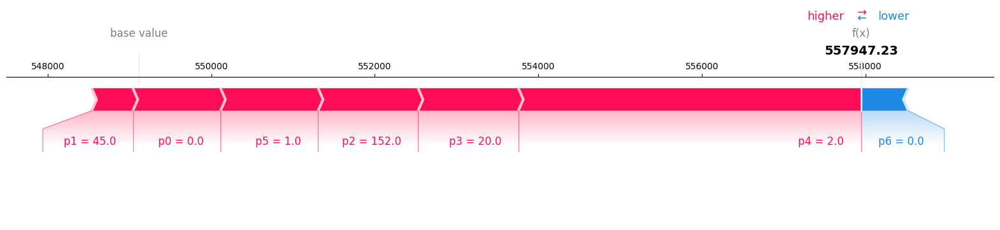

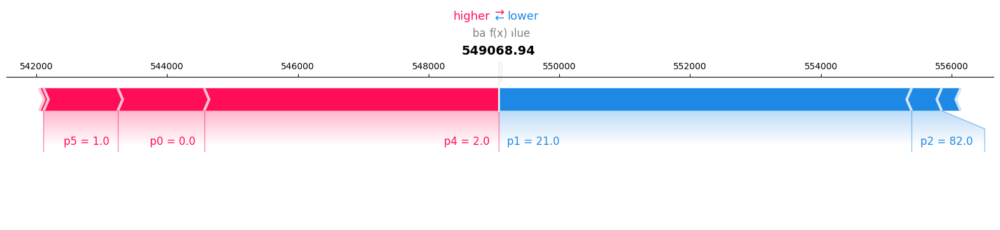

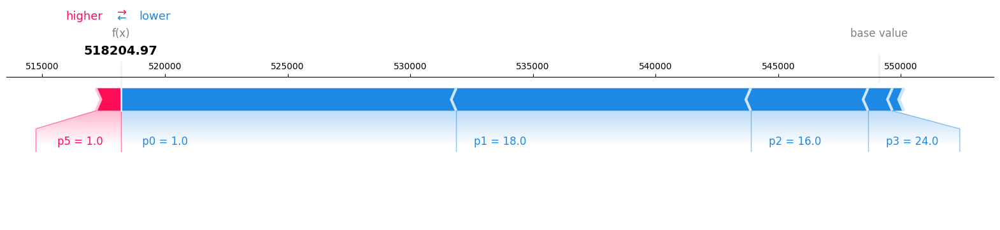

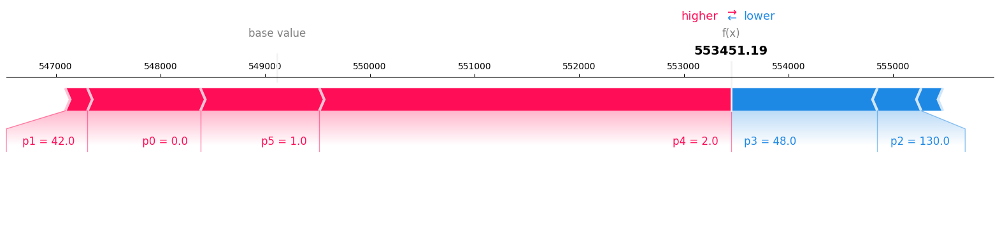

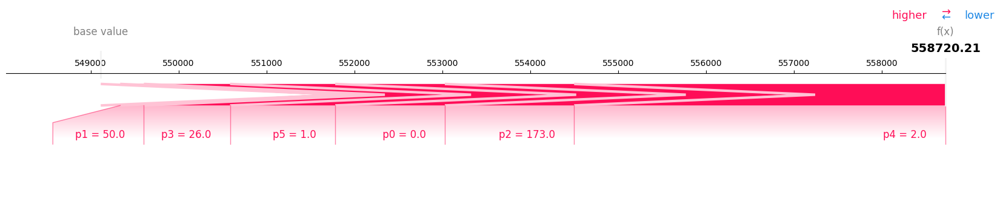

...

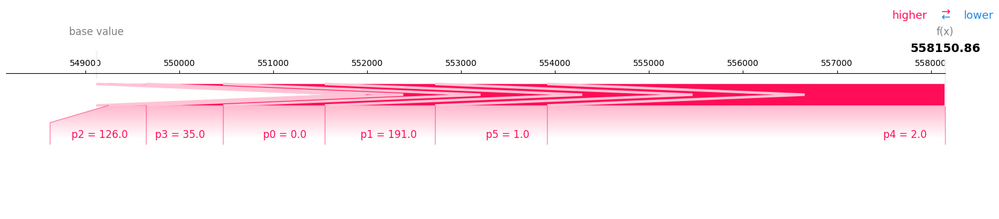

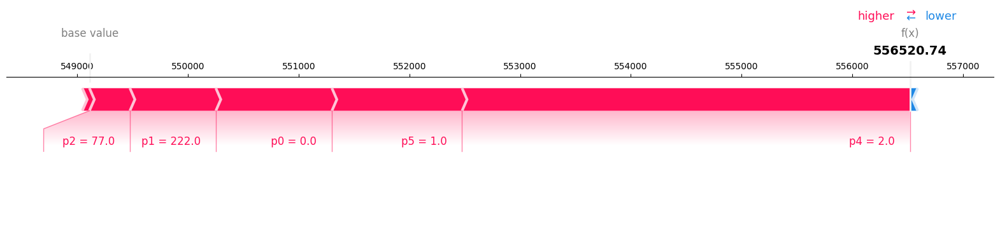

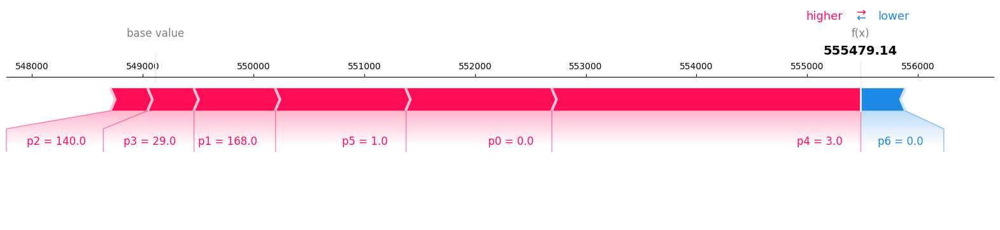

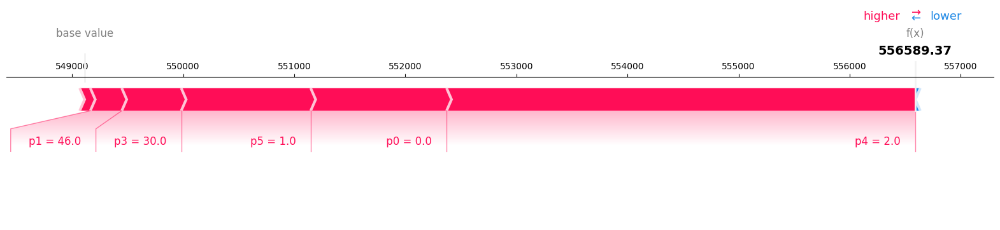

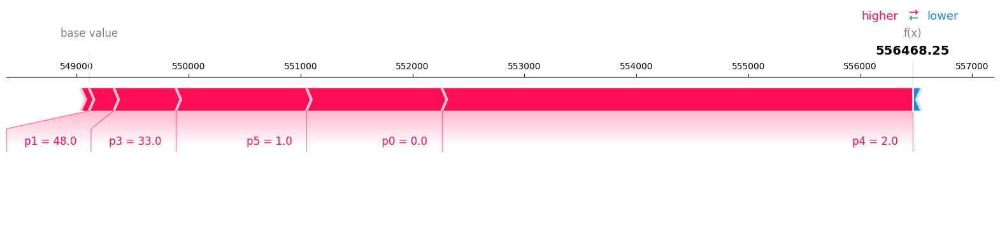

In [377]:
for i in random_indices: 
    choosen_instance = X_test1.loc[[i]]
    shap_values = explainer.shap_values(choosen_instance)
    shap.initjs()
    shap.force_plot(explainer.expected_value, shap_values, choosen_instance,matplotlib=True)